<h1 style="font-size: 38px; text-align: center; color: blue">The implementation of deep learning to develop an adequate tool for identifying the bumblebee species in Ireland</h1>

<br> </br>

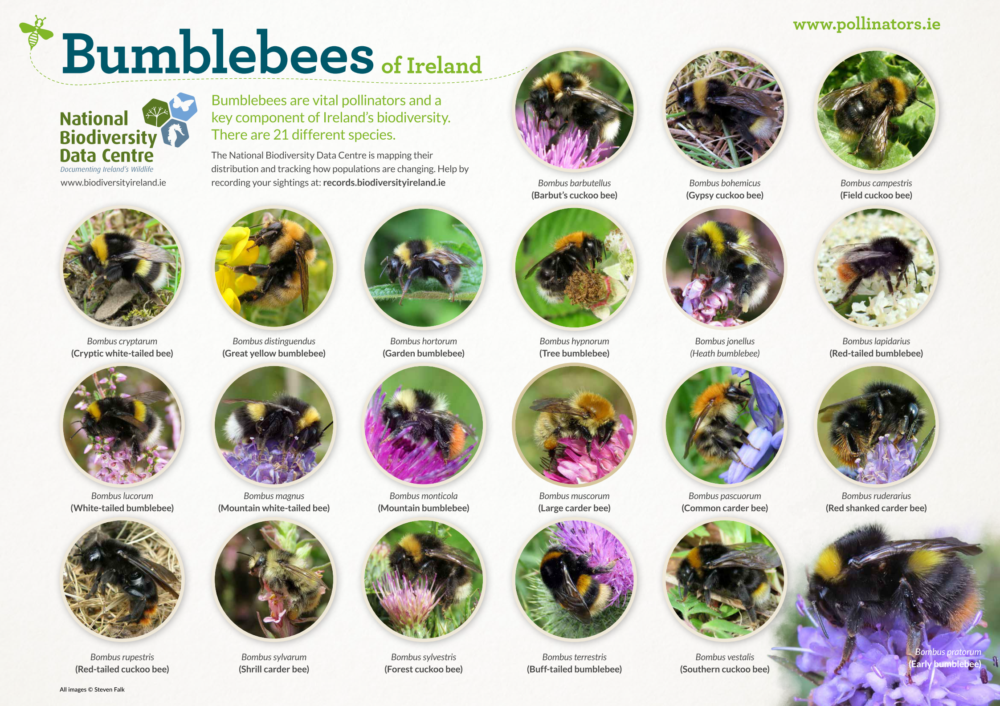

<br> </br>

In [1]:
# Import libraries
import os
import shutil
import random
import xml.etree.ElementTree as ET
import cv2

import warnings
warnings.filterwarnings("ignore")

# Import libraries
import pathlib
import itertools
import glob
import numpy as np

import PIL
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# Set data directory for training, validating and testing
training_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/train/')
validate_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/validate/')

print(training_data_dir)
print(validate_data_dir)

/home/hduser/Desktop/final dataset testing/machine learning/train
/home/hduser/Desktop/final dataset testing/machine learning/validate


<br> </br>
- **Check the image in the train folder**

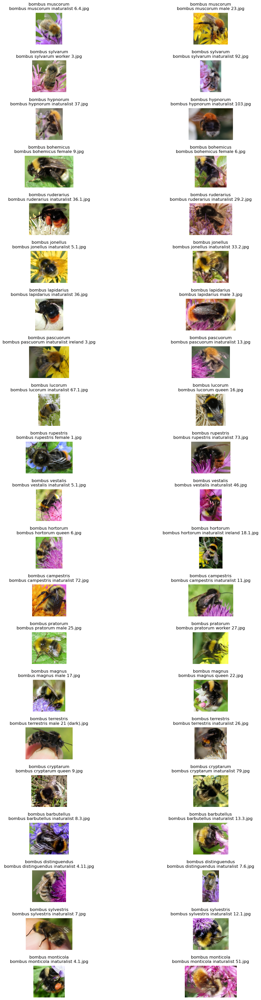

In [3]:
# Get the list of subdirectories (species)
species_list = [subdir.name for subdir in training_data_dir.glob('*')]

# Create a subplot grid
fig, axes = plt.subplots(21, 2, figsize=(15, 50))

# Adjust layout to provide space for titles
plt.subplots_adjust(hspace=0.5)

# Loop through each species
for i, species in enumerate(species_list):
    # Get two images from each species
    species_images = list(training_data_dir.glob(f'{species}/*'))[:2]

    # Loop through each image for the species
    for j, image_path in enumerate(species_images):
        image = Image.open(str(image_path))

        # Extract filename from path
        filename = os.path.basename(image_path)

        # Display the image on the subplot
        axes[i, j].imshow(image)
        axes[i, j].set_title(f'{species}\n{filename}', y=1.02)  # Adjust y position for title
        axes[i, j].axis('off')

plt.show()

<br> </br>

<h1 style="font-size: 28px; text-align: center; color: green"> 3. Deep Learning Models Training using Pytorch </h1>

<br> </br>

In [4]:
# Import libraries
import pandas as pd

import time
import copy

from __future__ import print_function 
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torch.utils import data
from torch.utils.data import DataLoader, Dataset, ConcatDataset
from torchvision.transforms import v2 as T
import torchvision.transforms.functional as TF

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

In [5]:
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  2.1.0
Torchvision Version:  0.16.0


<br> </br>
- <h1 style="font-size: 16px"> Create functions for building and training pre-trained models in Pytorch. </h1>
<br> </br>

In [6]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [7]:
def initialize_model(model_name, num_classes, feature_extract):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None

    if model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_1(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
    
    elif model_name == "densenet":
        """ Densenet121
        """
        model_ft = models.densenet121(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)

    elif model_name == "mnasnet":
        """ MNASNET1_0
        """
        model_ft = models.mnasnet1_0(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[1].in_features
        model_ft.classifier[1] = nn.Linear(num_ftrs, num_classes)
        model_ft.num_classes = num_classes

    elif model_name == "shufflenet":
        """ ShuffleNetV2
        """
        model_ft = models.shufflenet_v2_x2_0(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    elif model_name == "googlenet":
        """ GoogleNet
        """
        model_ft = models.googlenet(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    else:
        print("Invalid model name, exiting...")
        exit()
    
    return model_ft

In [8]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_squeezenet=False):
    since = time.time()

    history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

        for phase in ['train', 'validate']:
            if phase == 'train':
                scheduler.step()
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    if is_squeezenet and phase == 'train':
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                        if not is_squeezenet and phase == 'train':
                            outputs, aux_outputs = outputs

                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

            # Save information in history
            if phase == 'train':
                train_loss = epoch_loss
                train_accuracy = epoch_acc.item()
            elif phase == 'validate':
                validate_loss = epoch_loss
                validate_accuracy = epoch_acc.item()
                
            if phase == 'validate' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        
        history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])
        
        epoch_end = time.time()
        print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

    model.load_state_dict(best_model_wts)

    return model, history

In [9]:
# def train_model_with_early_stopping(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_squeezenet=False, patience=5):
#     since = time.time()

#     history = []

#     best_model_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0

#     device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#     model = model.to(device)

#     counter = 0  # Counter for early stopping
#     early_stop = False

#     for epoch in range(num_epochs):
#         epoch_start = time.time()
#         print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

#         for phase in ['train', 'validate']:
#             if phase == 'train':
#                 scheduler.step()
#                 model.train()
#             else:
#                 model.eval()

#             running_loss = 0.0
#             running_corrects = 0

#             for inputs, labels in dataloaders[phase]:
#                 inputs = inputs.to(device)
#                 labels = labels.to(device)

#                 optimizer.zero_grad()

#                 with torch.set_grad_enabled(phase == 'train'):
#                     if is_squeezenet and phase == 'train':
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)
#                     else:
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)

#                         if not is_squeezenet and phase == 'train':
#                             outputs, aux_outputs = outputs

#                     _, preds = torch.max(outputs, 1)

#                     if phase == 'train':
#                         loss.backward()
#                         optimizer.step()

#                 running_loss += loss.item() * inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)

#             epoch_loss = running_loss / len(dataloaders[phase].dataset)
#             epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

#             print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

#             # Save information in history
#             if phase == 'train':
#                 train_loss = epoch_loss
#                 train_accuracy = epoch_acc.item()
#             elif phase == 'validate':
#                 validate_loss = epoch_loss
#                 validate_accuracy = epoch_acc.item()

#                 # Early stopping check
#                 if validate_accuracy > best_acc:
#                     best_acc = validate_accuracy
#                     best_model_wts = copy.deepcopy(model.state_dict())
#                     counter = 0  # Reset counter if there's an improvement
#                 else:
#                     counter += 1
#                     if counter >= patience:
#                         early_stop = True
#                         print("Early stopping triggered.")
#                         break

#         history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])

#         epoch_end = time.time()
#         print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
#         print()

#         if early_stop:
#             break  # Break out of the main loop if early stopping is triggered

#     time_elapsed = time.time() - since
#     print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
#     print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

#     model.load_state_dict(best_model_wts)

#     return model, history

<br> </br>

In [10]:
# Number of classes
num_classes = len(os.listdir(training_data_dir))
print(num_classes)

# Batch size for training
batch_size = 32

# Set input size of the images
input_size = 224

21


<br> </br>
<h1 style="font-size: 28px; text-align: center; color: orange"> Data Augmentation </h1>
<br> </br>

- <h1 style="font-size: 16px"> RandomPadding and cropping; some popular geometric transformation methods, such flipping and rotating; RandAugmentation </h1> </h1>
<br> </br>

In [11]:
# Applying Transforms to the Data
original_data_transform = { 
    'train': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'validate': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
}

In [12]:
# Define data transformations for different augmentations
random_geometric_transform = T.Compose([
    #T.Resize(input_size),
    #T.RandomResizedCrop(input_size),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomRotation(degrees=30),
    T.ColorJitter(brightness=0.2),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Specify the range for random padding
padding_range = (0, 40)

# Create the random zero padding transform
random_padding_transform = T.Compose([
    #T.RandomResize(input_size),
    #T.RandomResizedCrop(input_size),
    lambda img: TF.pad(img, tuple(random.randint(padding_range[0], 
                                                 padding_range[1]) for _ in range(4)), fill=0),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


randaugment_transform = T.Compose([
    #T.Resize(input_size),
    #T.RandomResizedCrop(size=(input_size, input_size)),
    T.RandomApply([T.GaussianBlur(kernel_size=3)], p=0.5),
    T.RandomApply([T.RandomPosterize(bits=4)], p=0.5),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [13]:
# Load original dataset
original_train_dataset = datasets.ImageFolder(root=training_data_dir, 
                                              transform=original_data_transform['train'])

# Create augmented datasets
geometric_augmented_dataset = datasets.ImageFolder(root=training_data_dir, 
                                                   transform=random_geometric_transform)
    
random_padded_dataset = datasets.ImageFolder(root=training_data_dir, transform=random_padding_transform)

randaugment_dataset = datasets.ImageFolder(root=training_data_dir, 
                                           transform=randaugment_transform)

# Load validate dataset
validate_dataset = datasets.ImageFolder(root=validate_data_dir, 
                                        transform=original_data_transform['validate'])

In [14]:
##Spare one (ignore)

# random_padding_transform = T.Compose([
#     T.RandomResizedCrop(input_size),
#     T.Pad(padding=20, padding_mode='constant'),
#     T.Resize((input_size, input_size)),
#     T.ToTensor(),
#     T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
# ])

#random_padded_dataset = datasets.ImageFolder(root=training_data_dir, 
#                                              transform=random_padding_transform)

In [15]:
# Define a function to plot images
def plot_images(dataset, title):
    # Create a DataLoader for the dataset
    loader = DataLoader(dataset, batch_size=8, shuffle=True)
    
    # Retrieve a batch of images and labels
    images, labels = next(iter(loader))

    # Plotting code
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    axes = axes.flatten()

    for i in range(5):
        im = images[i].cpu().numpy().transpose((1, 2, 0))
        axes[i].imshow(im)
        axes[i].set_title(dataset.classes[labels[i]], size=10)
        axes[i].axis('off')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


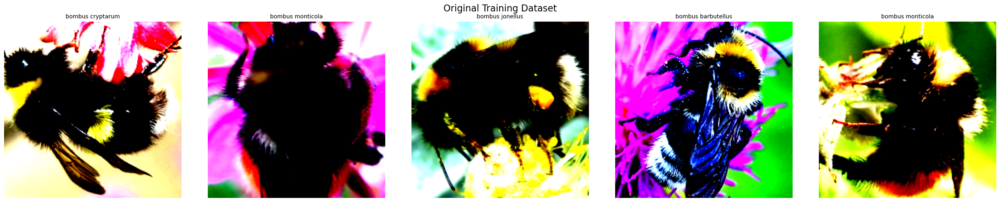

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


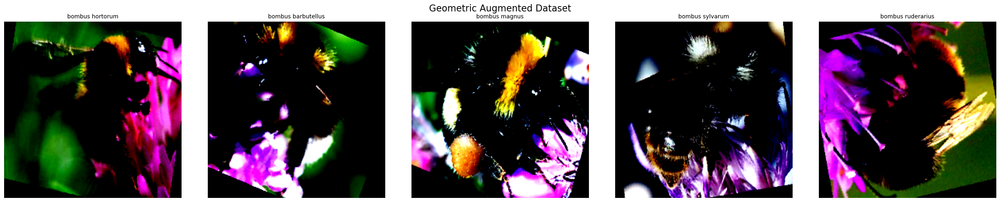

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


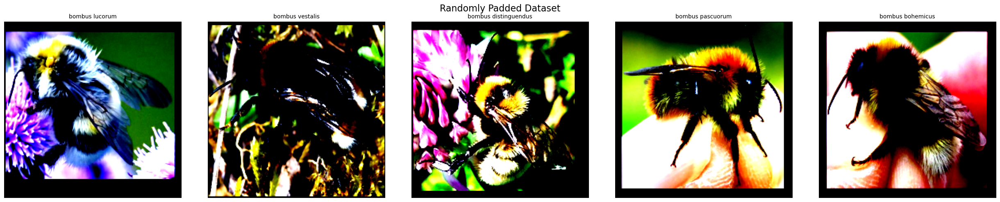

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


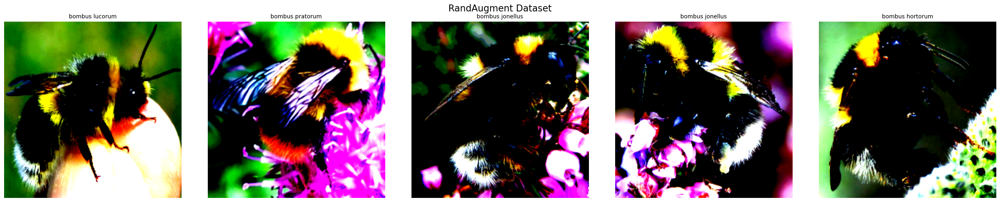

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


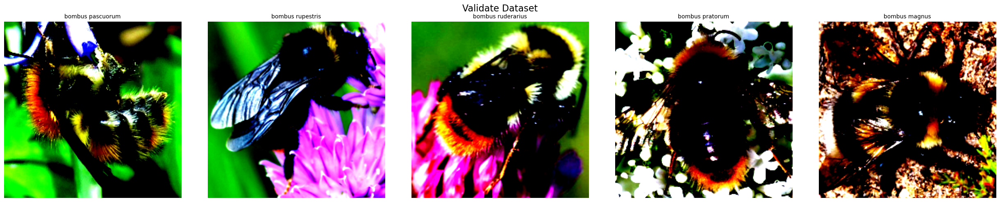

In [16]:
# Plot images from the original training dataset
plot_images(original_train_dataset, 'Original Training Dataset')

# Plot images from the geometric augmented dataset
plot_images(geometric_augmented_dataset, 'Geometric Augmented Dataset')

# Plot images from the randomly padded dataset
plot_images(random_padded_dataset, 'Randomly Padded Dataset')

# Plot images from the RandAugment dataset
plot_images(randaugment_dataset, 'RandAugment Dataset')

# Plot images from the validate dataset
plot_images(validate_dataset, 'Validate Dataset')

In [17]:
# Combine augmented datasets
combined_dataset = ConcatDataset([
    original_train_dataset,
    geometric_augmented_dataset,
    random_padded_dataset,
    randaugment_dataset
])

In [18]:
num_workers = 4

train_loader_final = DataLoader(combined_dataset, batch_size=batch_size, 
                                shuffle=True, num_workers=num_workers)
validate_dataloader = DataLoader(validate_dataset, batch_size=batch_size,
                                shuffle=True, num_workers=num_workers)

In [19]:
dataloaders_dict = {
    'train': train_loader_final,
    'validate': validate_dataloader
}

In [20]:
# Get a mapping of the indices to the class names, in order to see the output classes of the test images.
idx_to_class = {v: k for k, v in original_train_dataset.class_to_idx.items()}
print(idx_to_class)

{0: 'bombus barbutellus', 1: 'bombus bohemicus', 2: 'bombus campestris', 3: 'bombus cryptarum', 4: 'bombus distinguendus', 5: 'bombus hortorum', 6: 'bombus hypnorum', 7: 'bombus jonellus', 8: 'bombus lapidarius', 9: 'bombus lucorum', 10: 'bombus magnus', 11: 'bombus monticola', 12: 'bombus muscorum', 13: 'bombus pascuorum', 14: 'bombus pratorum', 15: 'bombus ruderarius', 16: 'bombus rupestris', 17: 'bombus sylvarum', 18: 'bombus sylvestris', 19: 'bombus terrestris', 20: 'bombus vestalis'}


In [21]:
# Initialize an empty dictionary for the mapping
idx_to_class = {}

# Iterate through each dataset in the ConcatDataset
for dataset in combined_dataset.datasets:
    # Assuming each dataset has a 'class_to_idx' attribute
    idx_to_class.update({v: k for k, v in dataset.class_to_idx.items()})

print(idx_to_class)

{0: 'bombus barbutellus', 1: 'bombus bohemicus', 2: 'bombus campestris', 3: 'bombus cryptarum', 4: 'bombus distinguendus', 5: 'bombus hortorum', 6: 'bombus hypnorum', 7: 'bombus jonellus', 8: 'bombus lapidarius', 9: 'bombus lucorum', 10: 'bombus magnus', 11: 'bombus monticola', 12: 'bombus muscorum', 13: 'bombus pascuorum', 14: 'bombus pratorum', 15: 'bombus ruderarius', 16: 'bombus rupestris', 17: 'bombus sylvarum', 18: 'bombus sylvestris', 19: 'bombus terrestris', 20: 'bombus vestalis'}


In [22]:
# Size of train and validate data
train_data_size = len(combined_dataset)
validate_data_size = len(validate_dataset)

print(train_data_size, validate_data_size)

12096 756


In [23]:
# Detect if GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [ ]:
# Number of epochs for training
num_epochs = 30

# Values for decaying
step_size = 23
gamma = 0.9

# Flag for feature extracting. When False, we finetune the whole model, 
# When True we only update the reshaped layer params
feature_extract = True

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.1 SqueezeNet1_1 </h1>
<br> </br>

In [24]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "squeezenet"

In [25]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model instantiated
print(model_ft)

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

In [26]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

Params to learn:
	 classifier.1.weight
	 classifier.1.bias


In [27]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [28]:
model_squeezenet, result_squeezenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, 
                                                  exp_lr_scheduler, num_epochs=num_epochs, 
                                                  is_squeezenet=(model_name=="squeezenet"))

Epoch: 001/030
Train Loss: 2.2355 Accuracy: 32.3661%
Validate Loss: 1.8668 Accuracy: 41.7989%
Epoch duration: 146.9820s

Epoch: 002/030
Train Loss: 1.5889 Accuracy: 50.6118%
Validate Loss: 1.6687 Accuracy: 46.4286%
Epoch duration: 147.3478s

Epoch: 003/030
Train Loss: 1.3941 Accuracy: 55.9441%
Validate Loss: 1.5697 Accuracy: 48.5450%
Epoch duration: 141.5727s

Epoch: 004/030
Train Loss: 1.3000 Accuracy: 58.8046%
Validate Loss: 1.5764 Accuracy: 49.6032%
Epoch duration: 141.6108s

Epoch: 005/030
Train Loss: 1.2292 Accuracy: 61.5410%
Validate Loss: 1.5439 Accuracy: 51.0582%
Epoch duration: 143.8259s

Epoch: 006/030
Train Loss: 1.1192 Accuracy: 64.7487%
Validate Loss: 1.5367 Accuracy: 52.5132%
Epoch duration: 140.9152s

Epoch: 007/030
Train Loss: 1.0882 Accuracy: 65.8896%
Validate Loss: 1.5285 Accuracy: 50.2646%
Epoch duration: 141.3381s

Epoch: 008/030
Train Loss: 1.0662 Accuracy: 66.7245%
Validate Loss: 1.5264 Accuracy: 50.6614%
Epoch duration: 139.6361s

Epoch: 009/030
Train Loss: 1.066

In [29]:
# model_squeezenet, result_squeezenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                       criterion, optimizer_ft,
#                                                                       exp_lr_scheduler, num_epochs=num_epochs,
#                                                                       is_squeezenet=(model_name=="squeezenet"),
#                                                                       patience=15)

In [30]:
torch.save(model_squeezenet.state_dict(), "model_squeezenet.pth")

<br> </br>
- <h1 style="font-size: 16px"> Create functions for plotting results using Pytorch. </h1>
<br> </br>

In [31]:
def plot_accuracy_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 1], label="Training Accuracy", color='green')
    plt.plot(epochs_range, history[:, 3], label="Validation Accuracy", color='blue', linestyle='--')
    
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Accuracy of {model_name} Model')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [32]:
def plot_loss_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 0], label="Training Loss", color='green')
    plt.plot(epochs_range, history[:, 2], label="Validation Loss", color='blue', linestyle='--')
    
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Loss of {model_name} Model')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [33]:
def plot_confusion_matrix_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    all_preds = []
    all_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(all_preds)
    true_labels = np.array(all_labels)

    # Compute the confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)

    # Plot the confusion matrix using seaborn
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]  # Use class names from the mapping
    
    plt.figure(figsize=(14, 10))
    sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)

    # Loop to annotate each cell in the heatmap
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            plt.text(j + 0.5, i + 0.5, str(conf_matrix[i, j]), ha='center', va='center',
                     bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.3'))

    plt.xticks(rotation=45)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix of {model_name} Model', fontsize=20)
    plt.show()

In [34]:
def plot_classification_report_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    all_preds = []
    all_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(all_preds)
    true_labels = np.array(all_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    # Generate classification report dictionary
    report_dict = classification_report(true_labels, predicted_labels, 
                                        target_names=class_names, output_dict=True)

    # Extract metrics for each class
    precision = [report_dict[class_name]['precision'] for class_name in class_names]
    recall = [report_dict[class_name]['recall'] for class_name in class_names]
    f1_score = [report_dict[class_name]['f1-score'] for class_name in class_names]

    # Plotting using subplots
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(16, 18), sharex=True)

    # Plot precision
    axs[0].bar(class_names, precision, color='blue')
    axs[0].set_ylabel('Precision')
    axs[0].set_title('Precision by Class')
    axs[0].grid(True, alpha=0.5)

    # Plot recall
    axs[1].bar(class_names, recall, color='green')
    axs[1].set_ylabel('Recall')
    axs[1].set_title('Recall by Class')
    axs[1].grid(True, alpha=0.5)

    # Plot F1-score
    axs[2].bar(class_names, f1_score, color='orange')
    axs[2].set_xlabel('Class Names')
    axs[2].set_ylabel('F1-Score')
    axs[2].set_title('F1-Score by Class')
    axs[2].grid(True, alpha=0.5)

    # Adjust layout and rotate x-axis labels
    plt.tight_layout(pad=7.0)
    plt.xticks(rotation=45, ha='right')
    
    # Add a title on top
    plt.suptitle(f'Classification Report Overview of {model_name} Model', fontsize=20)

    plt.show()

In [35]:
def print_classification_report_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    predictions = []
    true_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    # Generate classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    
    print(f"Classification Report of {model_name} Model:\n", report)

In [36]:
def plot_roc_curves_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    predictions = []
    true_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            predictions.extend(outputs.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    plt.figure(figsize=(14, 10))

    for class_index in range(len(class_names)):
        # Binarize true labels for the current class
        true_labels_bin = label_binarize(true_labels, classes=np.unique(true_labels))
        true_labels_bin = true_labels_bin[:, class_index]

        # Compute ROC curve and AUC
        fpr, tpr, _ = roc_curve(true_labels_bin, predicted_labels[:, class_index])
        auc_score = auc(fpr, tpr)

        label = f'{class_names[class_index]} (AUC = {auc_score:.2f})'
        plt.plot(fpr, tpr, label=label)

    plt.xlabel('False Positive Rate (Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    
    plt.title(f'ROC Curves of {model_name} Model', fontsize=16)
    plt.grid(True, alpha=0.5)
    plt.legend(loc='lower right', bbox_to_anchor=(1, 0), ncol=2, title="species names")

    plt.show()

<br> </br>

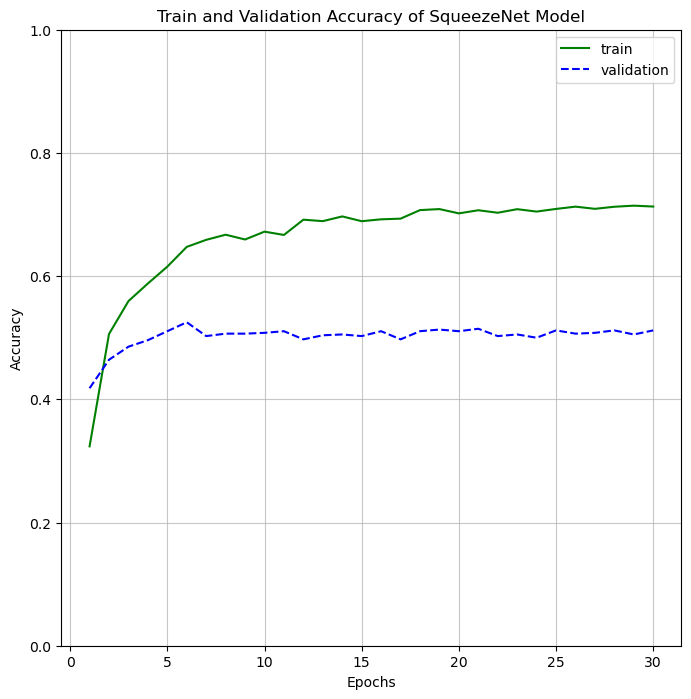

In [37]:
plot_accuracy_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

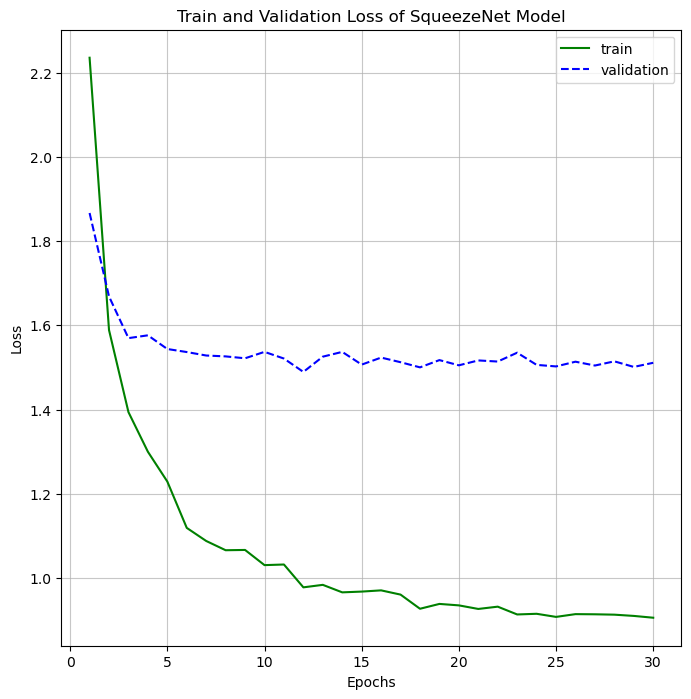

In [38]:
plot_loss_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

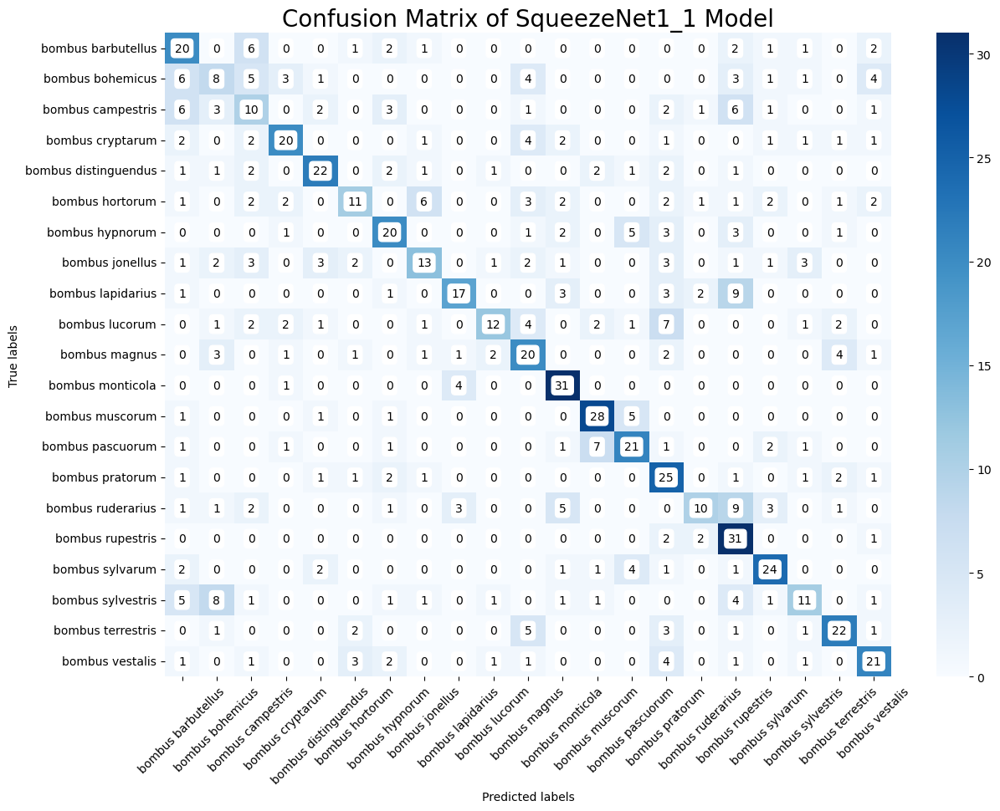

In [39]:
plot_confusion_matrix_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                              idx_to_class, 'SqueezeNet1_1')

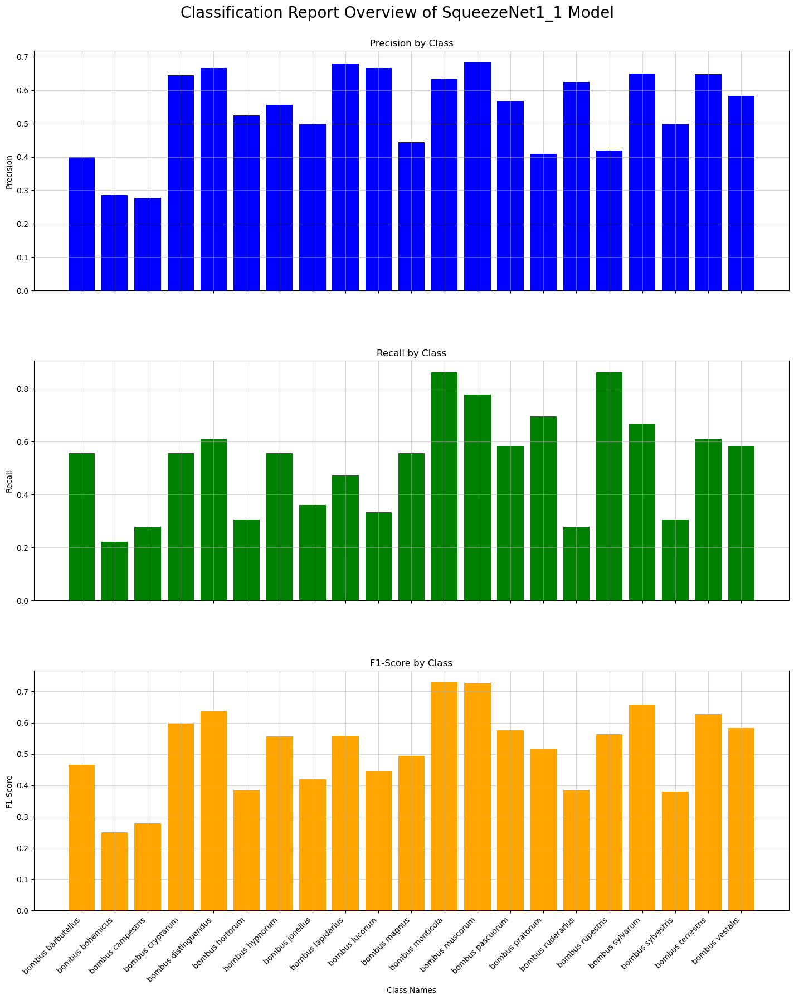

In [40]:
plot_classification_report_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                                   idx_to_class, "SqueezeNet1_1")

In [41]:
print_classification_report_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                                    idx_to_class, "SqueezeNet1_1")

Classification Report of SqueezeNet1_1 Model:
                       precision    recall  f1-score   support

  bombus barbutellus       0.40      0.56      0.47        36
    bombus bohemicus       0.29      0.22      0.25        36
   bombus campestris       0.28      0.28      0.28        36
    bombus cryptarum       0.65      0.56      0.60        36
bombus distinguendus       0.67      0.61      0.64        36
     bombus hortorum       0.52      0.31      0.39        36
     bombus hypnorum       0.56      0.56      0.56        36
     bombus jonellus       0.50      0.36      0.42        36
   bombus lapidarius       0.68      0.47      0.56        36
      bombus lucorum       0.67      0.33      0.44        36
       bombus magnus       0.44      0.56      0.49        36
    bombus monticola       0.63      0.86      0.73        36
     bombus muscorum       0.68      0.78      0.73        36
    bombus pascuorum       0.57      0.58      0.58        36
     bombus pratorum  

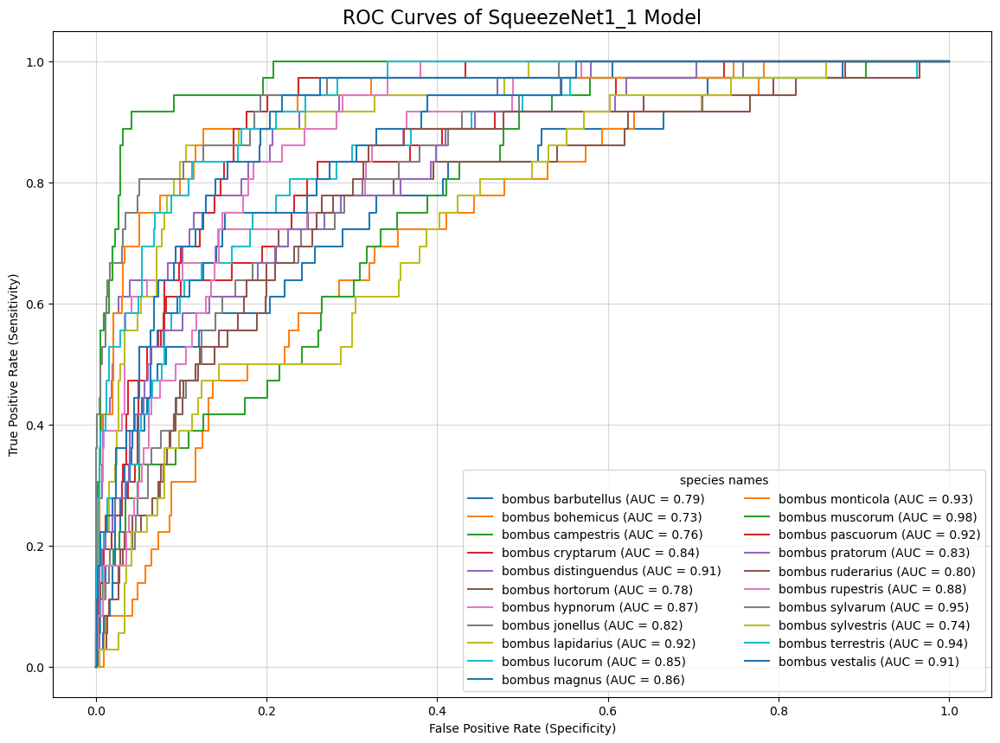

In [42]:
plot_roc_curves_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                        idx_to_class, "SqueezeNet1_1")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.2 DenseNet121 </h1>
<br> </br>

In [43]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "densenet"

In [44]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [45]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

Params to learn:
	 classifier.weight
	 classifier.bias


In [46]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [47]:
model_densenet, result_densenet = train_model(model_ft, dataloaders_dict, 
                                              criterion, optimizer_ft, exp_lr_scheduler, 
                                              num_epochs=num_epochs, 
                                              is_squeezenet=(model_name=="densenet"))

Epoch: 001/030
Train Loss: 2.3352 Accuracy: 33.4987%
Validate Loss: 2.0138 Accuracy: 40.8730%
Epoch duration: 896.2041s

Epoch: 002/030
Train Loss: 1.6794 Accuracy: 52.9349%
Validate Loss: 1.7566 Accuracy: 45.6349%
Epoch duration: 901.8765s

Epoch: 003/030
Train Loss: 1.4537 Accuracy: 57.6637%
Validate Loss: 1.6275 Accuracy: 48.8095%
Epoch duration: 901.1254s

Epoch: 004/030
Train Loss: 1.3245 Accuracy: 60.8548%
Validate Loss: 1.6004 Accuracy: 50.1323%
Epoch duration: 911.4902s

Epoch: 005/030
Train Loss: 1.1953 Accuracy: 66.0632%
Validate Loss: 1.5436 Accuracy: 51.7196%
Epoch duration: 892.6981s

Epoch: 006/030
Train Loss: 1.1870 Accuracy: 66.3608%
Validate Loss: 1.5525 Accuracy: 51.4550%
Epoch duration: 906.3151s

Epoch: 007/030
Train Loss: 1.1873 Accuracy: 65.9474%
Validate Loss: 1.5403 Accuracy: 50.9259%
Epoch duration: 906.0226s

Epoch: 008/030
Train Loss: 1.1729 Accuracy: 66.3112%
Validate Loss: 1.5345 Accuracy: 50.2646%
Epoch duration: 888.9879s

Epoch: 009/030
Train Loss: 1.157

KeyboardInterrupt: 

In [ ]:
# model_densenet, result_densenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                   criterion, optimizer_ft,
#                                                                   exp_lr_scheduler, num_epochs=num_epochs,
#                                                                   is_squeezenet=(model_name=="densenet"),
#                                                                   patience=5)

In [ ]:
torch.save(model_densenet.state_dict(), "model_densenet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_densenet, 'Densenet121')

In [ ]:
plot_loss_pytorch(num_epochs, result_densenet, 'Densenet121')

In [ ]:
plot_confusion_matrix_pytorch(model_densenet, dataloaders_dict['validate'], 
                              idx_to_class, 'Densenet121')

In [ ]:
plot_classification_report_pytorch(model_densenet, dataloaders_dict['validate'], 
                                   idx_to_class, "Densenet121")

In [ ]:
print_classification_report_pytorch(model_densenet, dataloaders_dict['validate'], 
                                    idx_to_class, "Densenet121")

In [ ]:
plot_roc_curves_pytorch(model_densenet, dataloaders_dict['validate'], 
                        idx_to_class, "Densenet121")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.3 ShuffleNetV2 </h1>
<br> </br>

In [ ]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "shufflenet"

In [ ]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

In [ ]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

In [ ]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
model_shufflenet, result_shufflenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, exp_lr_scheduler, 
                                                  num_epochs=num_epochs, 
                                                  is_squeezenet=(model_name=="shufflenet"))

In [ ]:
# model_shufflenet, result_shufflenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                       criterion, optimizer_ft,
#                                                                       exp_lr_scheduler, num_epochs=num_epochs,
#                                                                       is_squeezenet=(model_name=="shufflenet"),
#                                                                       patience=5)

In [ ]:
torch.save(model_shufflenet.state_dict(), "model_shufflenet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

In [ ]:
plot_loss_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

In [ ]:
plot_confusion_matrix_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                              idx_to_class, 'ShuffleNetV2')

In [ ]:
plot_classification_report_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                                   idx_to_class, "ShuffleNetV2")

In [ ]:
print_classification_report_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                                    idx_to_class, "ShuffleNetV2")

In [ ]:
plot_roc_curves_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                        idx_to_class, "ShuffleNetV2")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.4 GoogleNet </h1>
<br> </br>

In [ ]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "googlenet"

In [ ]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

In [ ]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

In [ ]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
model_googlenet, result_googlenet = train_model(model_ft, dataloaders_dict, 
                                                criterion, optimizer_ft, exp_lr_scheduler, 
                                                num_epochs=num_epochs, 
                                                is_squeezenet=(model_name=="googlenet"))

In [ ]:
# model_googlenet, result_googlenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                     criterion, optimizer_ft,
#                                                                     exp_lr_scheduler, num_epochs=num_epochs,
#                                                                     is_squeezenet=(model_name=="googlenet"),
#                                                                     patience=5)

In [ ]:
torch.save(model_googlenet.state_dict(), "model_googlenet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_googlenet, 'GoogleNet')

In [ ]:
plot_loss_pytorch(num_epochs, result_googlenet, 'GoogleNet')

In [ ]:
plot_confusion_matrix_pytorch(model_googlenet, dataloaders_dict['validate'], 
                              idx_to_class, 'GoogleNet')

In [ ]:
plot_classification_report_pytorch(model_googlenet, dataloaders_dict['validate'], 
                                   idx_to_class, "GoogleNet")

In [ ]:
print_classification_report_pytorch(model_googlenet, dataloaders_dict['validate'], 
                                    idx_to_class, "GoogleNet")

In [ ]:
plot_roc_curves_pytorch(model_googlenet, dataloaders_dict['validate'], 
                        idx_to_class, "GoogleNet")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.5 MNASNET1_0 </h1>
<br> </br>

In [ ]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "mnasnet"

In [ ]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

In [ ]:
# Send the model to CPU
model_ft = model_ft.to(device)

params_to_update = model_ft.parameters()
print("Params to learn:")

if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=gamma)

In [ ]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
model_mnasnet, result_mnasnet = train_model(model_ft, dataloaders_dict, 
                                            criterion, optimizer_ft, exp_lr_scheduler, 
                                            num_epochs=num_epochs, 
                                            is_squeezenet=(model_name=="mnasnet"))

In [ ]:
# model_mnasnet, result_mnasnet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                 criterion, optimizer_ft,
#                                                                 exp_lr_scheduler, num_epochs=num_epochs,
#                                                                 is_squeezenet=(model_name=="mnasnet"),
#                                                                 patience=5)

In [ ]:
torch.save(model_mnasnet.state_dict(), "model_mnasnet.pth")

In [ ]:
plot_accuracy_pytorch(num_epochs, result_mnasnet, 'MNASNET1_0')

In [ ]:
plot_loss_pytorch(num_epochs, result_mnasnet, 'MNASNET1_0')

In [ ]:
plot_confusion_matrix_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                              idx_to_class, 'MNASNET1_0')

In [ ]:
plot_classification_report_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                                   idx_to_class, "MNASNET1_0")

In [ ]:
print_classification_report_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                                    idx_to_class, "MNASNET1_0")

In [ ]:
plot_roc_curves_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                        idx_to_class, "MNASNET1_0")